In [1]:
import numpy as np
import matplotlib.pyplot as plt
from dask_quantumtinkerer import Cluster, cluster_options
import itertools as it
import scipy.sparse.linalg as sla
from collections import OrderedDict
import dask.bag as db

import ccode.solvers as sl
import ccode.kpm as kpm
from ccode.tools import separate_energies_wfs, get_potential, find_resonances
from ccode.plotting import plot_gates, plot_potential_at_barriers, multiline
from ccode.triangular_gates_2 import *

/opt/conda/lib/python3.9/site-packages/dask_gateway/client.py:21: FutureWarning: format_bytes is deprecated and will be removed in a future release. Please use dask.utils.format_bytes instead.
  from distributed.utils import LoopRunner, format_bytes


VoronoiMesh version 0.1
DiscretePoisson version 0.3
Shape version: 0.1
SystEquations version: 0.3
Solver version 0.1
Finding closed voronoi cells
Done selecting closed voronoi cells
Calculating points distance
Done
Calculating ridges hypersurfaces
Done
Finding  hypervolume for closed voronoi cells
Done finding hypervolume for closed voronoi cells
Done calculating surface
Done calculating distance
Done calculating capacitance matrix


/opt/conda/lib/python3.9/site-packages/sympy/__init__.py:672: SymPyDeprecationWarning: 

importing sympy.matrices.matrices with 'from sympy import *' has been
deprecated since SymPy 1.6. Use import sympy.matrices.matrices
instead. See https://github.com/sympy/sympy/issues/18245 for more
info.

  self.Warn(
/opt/conda/lib/python3.9/site-packages/sympy/__init__.py:672: SymPyDeprecationWarning: 

importing sympy.matrices.matrices with 'from sympy import *' has been
deprecated since SymPy 1.6. Use import sympy.matrices.matrices
instead. See https://github.com/sympy/sympy/issues/18245 for more
info.

  self.Warn(


In [2]:
def prepare_voltages(x, elements, fixed_gates={}):
    voltages = OrderedDict()
    for i, element in enumerate(elements):
        voltages[str(element)] = x[i]

    for key, value in fixed_gates.items():
        voltages[key] = value

    return voltages

In [3]:
np.warnings.filterwarnings("ignore", category=np.VisibleDeprecationWarning)
mu = sl.bands[0]

In [4]:
def tunnel_crossing(learner, mu, index, tol=1e-4):
    gathered_potentials = {}
    for key, value in learner.extra_data.items():
        gathered_potentials[key] = value['potential']

    crossings = []
    for key, value in gathered_potentials.items():
        if np.abs(value[index]-mu) < tol:
            crossings.append(key)

    return np.array(crossings)[:, ::-1]


def f_line(start, end):
    def f(x):
        m = (end[1]-start[1])/(end[0]-start[0])
        b = start[1] - m*start[0]
        return m*x + b
    return np.vectorize(f)

In [5]:
def average_single_level(ens, mus):

    averages = np.array([np.mean(gs[peaks[i]:peaks[i+1]]) for i in range(len(peaks)-1)])
    widths = np.array([mus[peaks[i+1]]-mus[peaks[i]] for i in range(len(peaks)-1)])
    centers = np.array([mus[peaks[i]]+widths[i]/2 for i in range(len(peaks)-1)])
    return averages, np.abs(widths), centers

# Cluster configuration

In [6]:
options = cluster_options()
options.worker_cores = 1
options.worker_memory = 4
options.extra_path = "/home/jtorresluna/trijunction_design/"

In [7]:
cluster = Cluster(options)

In [8]:
print(
    "http://io.quantumtinkerer.tudelft.nl/user/jdtorres/proxy/"
    + cluster.dashboard_link[17:]
)

http://io.quantumtinkerer.tudelft.nl/user/jdtorres/proxy/8000/clusters/da167ff8b0bb4ea4bb7fb86b5e2f49a6/status


In [9]:
client = cluster.get_client()

# Gate configuration

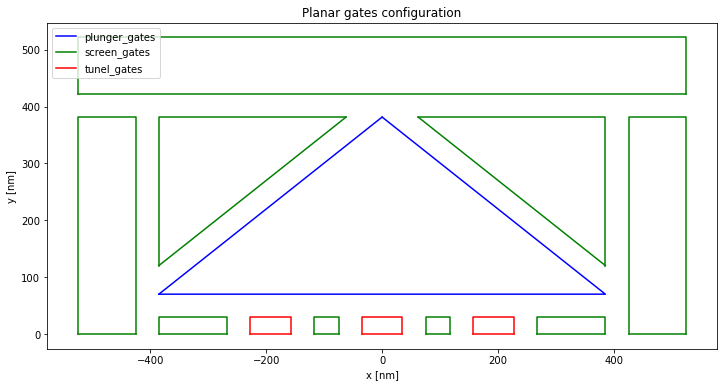

In [10]:
plot_gates(gates)

# Potential setup

In [11]:
def get_voltage_setup_LR():

    depleted = -0.015

    screen_voltages = {
        'right_screen_center': depleted,
        'right_screen_side': depleted,
        'right_screen': depleted,
        'left_screen_center': depleted,
        'left_screen_side': depleted,
        'left_screen':depleted,
        'right_screen_triangle': depleted,
        'left_screen_triangle': depleted,
        'top_screen': depleted
    }

    tunel_voltages = {
        'central_tunel': -0.02,#0.095,
        'left_tunel': 0.0225,#-0.07,
        'right_tunel': 0.0225#0.1
    }


    plunger_voltages = {'plunger_gate': 0.005}

    voltage_setup_LR = dict()
    voltage_setup_LR.update(screen_voltages)
    voltage_setup_LR.update(tunel_voltages)
    voltage_setup_LR.update(plunger_voltages)

    volt = list(voltage_setup_LR.values())
    gates = list(voltage_setup_LR.keys())
    voltage_setup_LR = prepare_voltages(volt, gates)

    return voltage_setup_LR

In [12]:
def get_voltage_setup_LC():
    depleted = -0.015

    screen_voltages = {
        'right_screen_center': depleted,
        'right_screen_side': depleted,
        'right_screen': depleted,
        'left_screen_center': -0.07,
        'left_screen_side': depleted,
        'left_screen':depleted,
        'right_screen_triangle': depleted,
        'left_screen_triangle': depleted,
        'top_screen': depleted
    }

    tunel_voltages = {
        'central_tunel': 0.036,#0.095,
        'left_tunel': 0.027,#-0.07,
        'right_tunel': -0.02#0.1
    }


    plunger_voltages = {'plunger_gate': 0.005}

    voltage_setup_LC = dict()
    voltage_setup_LC.update(screen_voltages)
    voltage_setup_LC.update(tunel_voltages)
    voltage_setup_LC.update(plunger_voltages)

    volt = list(voltage_setup_LC.values())
    gates = list(voltage_setup_LC.keys())
    voltage_setup_LC = prepare_voltages(volt, gates)

    return voltage_setup_LC

In [13]:
def get_voltage_setup_CR():

    depleted = -0.015

    screen_voltages = {
        'right_screen_center': depleted,
        'right_screen_side': depleted,
        'right_screen': depleted,
        'left_screen_center': depleted,
        'left_screen_side': depleted,
        'left_screen':depleted,
        'right_screen_triangle': depleted,
        'left_screen_triangle': depleted,
        'top_screen': depleted
    }

    tunel_voltages = {
        'central_tunel': -0.015,#0.095,
        'left_tunel': 0.012,#-0.07,
        'right_tunel': 0.012#0.1
    }


    plunger_voltages = {'plunger_gate': 0.00}

    voltage_setup_CR = dict()
    voltage_setup_CR.update(screen_voltages)
    voltage_setup_CR.update(tunel_voltages)
    voltage_setup_CR.update(plunger_voltages)

    volt = list(voltage_setup_CR.values())
    gates = list(voltage_setup_CR.keys())
    voltage_setup_CR = prepare_voltages(volt, gates)

    return voltage_setup_CR


In [82]:
voltage_setup = get_voltage_setup_LC()
voltage_setup['plunger_gate'] = -0.01
voltage_setup['left_screen_center'] = 0.01

clean_potential = potential(voltage_setup=voltage_setup)
clean_potential.update(
    (key, -1 * value) for key, value in clean_potential.items()
)

In [83]:
def plot_potential_as(potential=[], cut=[0.0], cmap="gist_heat_r", scale=1, **kwargs):

    total_potential = []
    for element in potential:
        coordinates = np.array(list(element.keys()))
        values = np.array(list(element.values()))
        total_potential.append(values)

    x = scale*coordinates[:, 0]
    y = scale*coordinates[:, 1]
    width = np.unique(x).shape[0]
    X = x.reshape(width, -1)
    Y = y.reshape(width, -1)
    Z = sum(total_potential).reshape(width, -1)

    fig = plt.figure(figsize=(15, 5))
    ax1 = fig.add_subplot(121)
    cont = ax1.contour(X, Y, Z, cmap=cmap, levels=200, **kwargs)
    cbar1 = fig.colorbar(cont, ax=ax1, format="%.4f")
    ax1.set_xlabel("X [nm]")
    ax1.set_ylabel("Y [nm]")

    ax1 = fig.add_subplot(122)
    for x in cut:
        poten = Z.T[np.argwhere(Y[0] == x)][0][0]
        ax1.plot(X[:, 0], poten)
    ax1.set_xlabel("X [nm]")
    ax1.set_ylabel("potential [eV]")

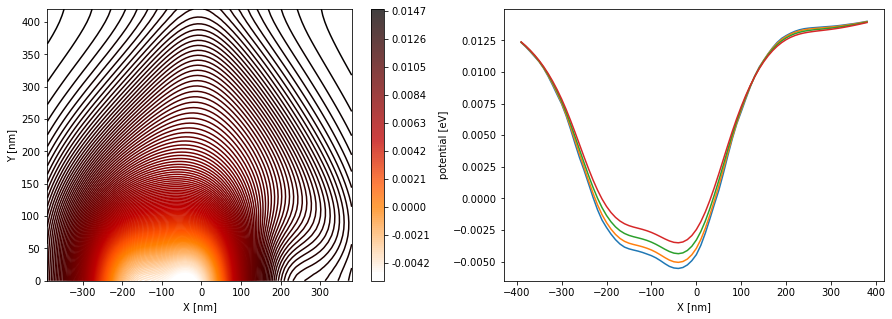

In [85]:
plot_potential_as([clean_potential], [0.0, 10.0, 20.0, 30.0], scale=10, vmin=-0.005, vmax=0.015)

In [17]:
def make_potentials(voltages, parameters, key):
    potentials = {}

    for v in parameters:
        voltages[key] = v
        clean_potential = potential(voltage_setup=voltages, grid_spacing=10e-9)
        potentials[v] = clean_potential

    return potentials

In [503]:
dic1 = {'a':0}
dic2 = {'c':0}

# Set up trijunction

(-1e-07, 4.4e-07)

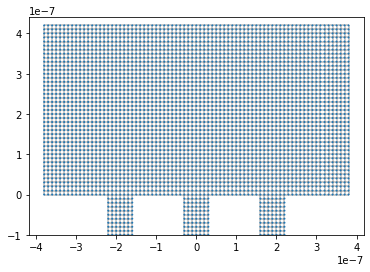

In [24]:
fig, ax = plt.subplots()
kwant.plot(trijunction, ax=ax);
ax.set_ylim(-1e-7, 4.4e-7)

In [27]:
center = 19*10e-9
top = 0
barriers = [(center, 10e-9), (-center, 10e-9), (0, 10e-9)]

# Left - Right MBS

## Adaptive map

In [696]:
import adaptive
from operator import itemgetter
adaptive.notebook_extension()

In [697]:
params = sl.junction_parameters(m_nw=[mu, mu, mu], m_qd=0)
params.update(sl.phase(0))

### Plunger vs tunel gates

In [40]:
voltage_setup_LR = get_voltage_setup_LR()

In [41]:
def f(xy):

    v_plunger, v_barrier = xy

    ham_mat, points = get_hamiltonian(voltage_setup=voltage_setup_LR,
                              key_1='plunger_gate',
                              val_1=v_plunger, 
                              key_2='left_tunel',
                              val_2=v_barrier,
                              params=params,
                              points=barriers)

    evals = np.sort(sla.eigsh(ham_mat.tocsc(), k=8, sigma=0, return_eigenvectors=False))

    return {'eigenvalues': np.abs(evals[-2]), 'potential': points}

In [42]:
%%time
f((0,0))

CPU times: user 3.67 s, sys: 103 ms, total: 3.77 s
Wall time: 3.76 s


{'eigenvalues': 8.661687637314514e-07,
 'potential': array([ 0.00072284, -0.00529016, -0.00837426])}

In [43]:
plunger_min = 0
plunger_max = 6e-3

tunel_min = 0
tunel_max = 40e-3

In [92]:
cluster.scale(n=40)

In [44]:
data_LR = []
_learner = adaptive.Learner2D(f, bounds=[(plunger_min, plunger_max), (tunel_min, tunel_max)])
learner = adaptive.DataSaver(_learner, arg_picker=itemgetter('eigenvalues'))
runner = adaptive.Runner(learner, goal=lambda l: l.learner.loss() < 0.005, executor=client)

In [45]:
runner.live_info()

In [46]:
_, _, z = learner.interpolated_on_grid()
data_LR.append(z)

In [47]:
data_LR[0].shape

(251, 251)

Text(0.5, 1.0, 'Left tunnel gate and plunger gate')

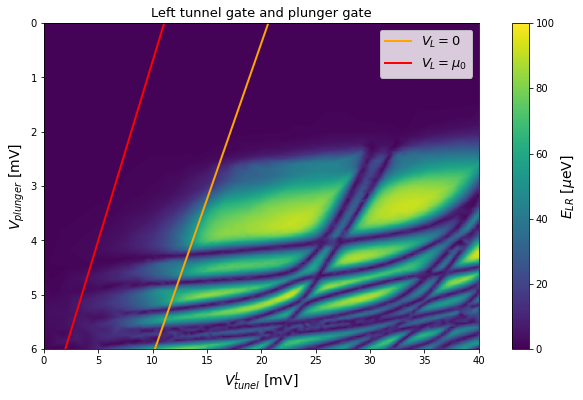

In [52]:
fig, ax = plt.subplots(figsize=(12, 6))

p = ax.imshow(1e6*data_LR[0],
              extent=(1e3*tunel_min, 1e3*tunel_max, 1e3*plunger_max, 1e3*plunger_min),
              aspect=5,vmin=0,vmax=100)
ax.set_ylabel(r'$V_{plunger}$ [mV]', fontsize=14)
ax.set_xlabel(r'$V_{tunel}^L$ [mV]', fontsize=14)
cb = plt.colorbar(p, ax=ax)
cb.set_label(r'$E_{LR}$ [$\mu$eV]', fontsize=14)

x = np.array([0, 40])

crossings_L_0 = tunnel_crossing(learner, mu=0, index=1, tol=1e-4)
crossings_L_mu = tunnel_crossing(learner, mu=-mu, index=1, tol=1e-4)

f_L_0 = f_line(1e3*crossings_L_0[0], 1e3*crossings_L_0[1])
f_L_mu = f_line(1e3*crossings_L_mu[0], 1e3*crossings_L_mu[1])

ax.plot(x, f_L_0(x), label=r'$V_L = 0$', color='orange', lw=2)
ax.plot(x, f_L_mu(x), label=r'$V_L = \mu_0$', color='red', lw=2)

ax.set_ylim(6, 0)
ax.legend(fontsize=13)
ax.set_title(r'Left tunnel gate and plunger gate', fontsize=13)

### Left vs Right tunnel gates

In [27]:
voltage_setup_LR = get_voltage_setup_LR()
voltage_setup_LR['plunger_gate'] = 0.00325

In [28]:
def f(xy):

    v_plunger, v_barrier = xy

    ham_mat, points = get_hamiltonian(voltage_setup=voltage_setup_LR,
                              key_1='right_tunel',
                              val_1=v_plunger, 
                              key_2='left_tunel',
                              val_2=v_barrier,
                              params=params,
                              points=barriers)

    evals = np.sort(sla.eigsh(ham_mat.tocsc(), k=8, sigma=0, return_eigenvectors=False))

    return {'eigenvalues': np.abs(evals[-2]), 'potential': points}

In [31]:
%%time
f((0,0))

CPU times: user 1.16 s, sys: 32.7 ms, total: 1.19 s
Wall time: 1.19 s


{'eigenvalues': 8.815793871829019e-07,
 'potential': array([-0.00419764, -0.00414878, -0.00781796])}

In [32]:
tunel_min = 0
tunel_max = 40e-3

In [33]:
cluster.scale(n=40)

In [34]:
data_LR_tunnels = []
_learner = adaptive.Learner2D(f, bounds=[(tunel_min, tunel_max), (tunel_min, tunel_max)])
learner = adaptive.DataSaver(_learner, arg_picker=itemgetter('eigenvalues'))
runner = adaptive.Runner(learner, goal=lambda l: l.learner.loss() < 0.005, executor=client)

In [35]:
runner.live_info()

tornado.application - ERROR - Exception in callback functools.partial(<bound method IOLoop._discard_future_result of <zmq.eventloop.ioloop.ZMQIOLoop object at 0x7fdb50533c10>>, <Future finished exception=InvalidStateError('CANCELLED: <Future at 0x7fdaf259c1f0 state=cancelled>')>)
Traceback (most recent call last):
  File "/opt/conda/lib/python3.9/site-packages/tornado/ioloop.py", line 741, in _run_callback
    ret = callback()
  File "/opt/conda/lib/python3.9/site-packages/tornado/ioloop.py", line 765, in _discard_future_result
    future.result()
  File "/opt/conda/lib/python3.9/site-packages/tornado/gen.py", line 775, in run
    yielded = self.gen.send(value)
  File "/opt/conda/lib/python3.9/site-packages/distributed/cfexecutor.py", line 22, in _cascade_future
    cf_future.set_result(result)
  File "/opt/conda/lib/python3.9/concurrent/futures/_base.py", line 533, in set_result
    raise InvalidStateError('{}: {!r}'.format(self._state, self))
concurrent.futures._base.InvalidStateErro

In [36]:
_, _, z = learner.interpolated_on_grid()
data_LR_tunnels.append(z)

In [37]:
data_LR_tunnels[0].shape

(240, 240)

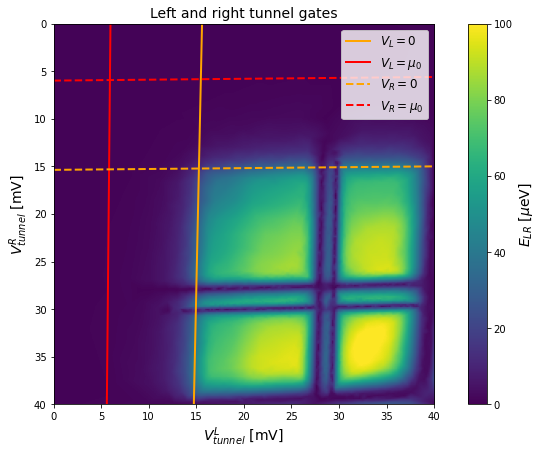

In [39]:
fig, ax = plt.subplots(figsize=(12, 7))

p = ax.imshow(1e6*data_LR_tunnels[0],
              extent=(1e3*tunel_min, 1e3*tunel_max, 1e3*tunel_max, 1e3*tunel_min),
              vmin=0, vmax=100)
ax.set_ylabel(r'$V_{tunnel}^{R}$ [mV]', fontsize=14)
ax.set_xlabel(r'$V_{tunnel}^{L}$ [mV]', fontsize=14)
cb = plt.colorbar(p, ax=ax)
cb.set_label(r'$E_{LR}$ [$\mu$eV]', fontsize=14)
ax.set_title(r'Left and right tunnel gates', fontsize=14)

x = np.array([tunel_min, tunel_max])*1e3

crossings_L_0 = tunnel_crossing(learner, mu=0, index=1, tol=0.5e-4)
crossings_R_0 = tunnel_crossing(learner, mu=0, index=0, tol=0.5e-4)

crossings_L_mu = tunnel_crossing(learner, mu=-mu, index=1, tol=4e-4)
crossings_R_mu = tunnel_crossing(learner, mu=-mu, index=0, tol=2.5e-4)

f_L_0 = f_line(1e3*crossings_L_0[0], 1e3*crossings_L_0[-1])
f_L_mu = f_line(1e3*crossings_L_mu[0], 1e3*crossings_L_mu[-1])

f_R_0 = f_line(1e3*crossings_R_0[0], 1e3*crossings_R_0[-1])
f_R_mu = f_line(1e3*crossings_R_mu[0], 1e3*crossings_R_mu[-1])

ax.plot(x, f_L_0(x), label=r'$V_L = 0$', color='orange', lw=2)
ax.plot(f_R_mu(x), x, label=r'$V_L = \mu_0$', color='red', lw=2)

ax.plot(x, f_R_0(x), color='orange', lw=2, linestyle='--', label=r'$V_R = 0$')
ax.plot(x, f_R_mu(x), color='red', lw=2, linestyle='--', label=r'$V_R = \mu_0$')

ax.set_ylim(x[::-1])
ax.set_xlim(x)

ax.legend(fontsize=12, loc='upper right')

### Plunger vs far tunel gate

In [714]:
params = sl.junction_parameters(m_nw=[mu, mu, mu], m_qd=0)
params.update(sl.phase(0))

In [715]:
voltage_setup_LR = get_voltage_setup_LR()

In [716]:
def f(xy):

    v_plunger, v_barrier = xy
    voltage_setup_LR['left_screen_triangle'] = v_barrier
    ham_mat, points = get_hamiltonian(voltage_setup=voltage_setup_LR,
                              key_1='plunger_gate',
                              val_1=v_plunger, 
                              key_2='right_screen_triangle',
                              val_2=v_barrier,
                              params=params,
                              points=barriers)

    evals = np.sort(sla.eigsh(ham_mat.tocsc(), k=8, sigma=0, return_eigenvectors=False))

    return {'eigenvalues': np.abs(evals[-2]), 'potential': points}

In [717]:
%%time
f((0,0))

CPU times: user 2.4 s, sys: 153 ms, total: 2.55 s
Wall time: 2.54 s


{'eigenvalues': 8.729416721410224e-07,
 'potential': array([ 0.00148773,  0.00146309, -0.00733939])}

In [718]:
plunger_min = 0
plunger_max = 10e-3

screen_min = -200e-3
screen_max = 0

In [701]:
cluster.scale(n=40)

In [719]:
data_LR = []
_learner = adaptive.Learner2D(f, bounds=[(plunger_min, plunger_max), (screen_min, screen_max)])
learner = adaptive.DataSaver(_learner, arg_picker=itemgetter('eigenvalues'))
runner = adaptive.Runner(learner, goal=lambda l: l.learner.loss() < 0.01, executor=client)

In [720]:
runner.live_info()

In [721]:
_, _, z = learner.interpolated_on_grid()
data_LR.append(z)

In [722]:
data_LR[0].shape

(411, 411)

Text(0.5, 1.0, 'Both screen triangular gates and plunger gate')

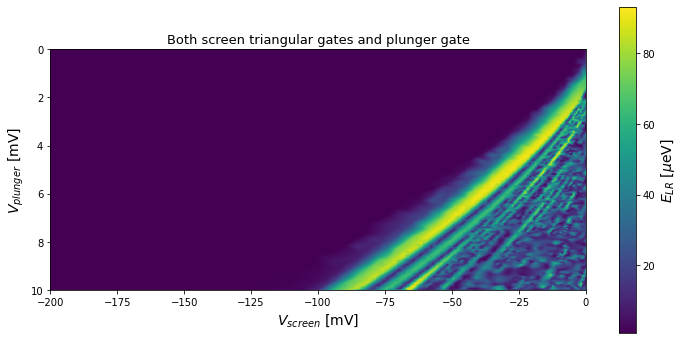

Exception in callback None()
handle: <Handle cancelled>
Traceback (most recent call last):
  File "/opt/conda/lib/python3.9/site-packages/tornado/iostream.py", line 1391, in _do_ssl_handshake
    self.socket.do_handshake()
  File "/opt/conda/lib/python3.9/ssl.py", line 1309, in do_handshake
    self._sslobj.do_handshake()
ssl.SSLEOFError: EOF occurred in violation of protocol (_ssl.c:1129)

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/opt/conda/lib/python3.9/asyncio/events.py", line 80, in _run
    self._context.run(self._callback, *self._args)
  File "/opt/conda/lib/python3.9/site-packages/tornado/platform/asyncio.py", line 189, in _handle_events
    handler_func(fileobj, events)
  File "/opt/conda/lib/python3.9/site-packages/tornado/iostream.py", line 696, in _handle_events
    self._handle_read()
  File "/opt/conda/lib/python3.9/site-packages/tornado/iostream.py", line 1478, in _handle_read
    self._do_ssl_handshak

In [723]:
fig, ax = plt.subplots(figsize=(12, 6))

p = ax.imshow(1e6*data_LR[0],
              extent=(1e3*screen_min, 1e3*screen_max, 1e3*plunger_max, 1e3*plunger_min),
              aspect=9)
ax.set_ylabel(r'$V_{plunger}$ [mV]', fontsize=14)
ax.set_xlabel(r'$V_{screen}$ [mV]', fontsize=14)
cb = plt.colorbar(p, ax=ax)
cb.set_label(r'$E_{LR}$ [$\mu$eV]', fontsize=14)

#ax.plot(x, f_L_0(x-40)[::-1], label=r'$V(x_t,y_t) = 0$', color='orange', lw=2)
#ax.plot(x, f_L_mu(x-40)[::-1], label=r'$V(x_t,y_t) = \mu_0$', color='red', lw=2)

ax.set_title(r'Both screen triangular gates and plunger gate', fontsize=13)

## Plunger gate dependence

In [300]:
voltage_setup = get_voltage_setup_LR()

In [301]:
key = 'plunger_gate'
volts = np.linspace(0.001, 0.0047, 100)
potentials_plunger = make_potentials(voltages=voltage_setup,
                                     parameters=volts,
                                     key=key)

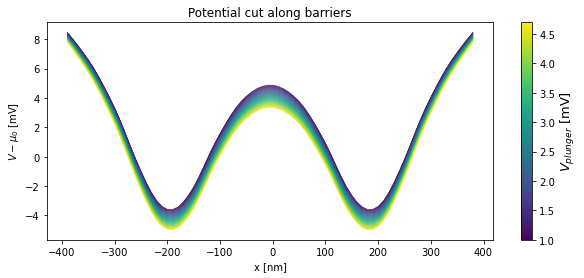

In [302]:
plot_potential_at_barriers(volts=volts,
                           potentials=potentials_plunger,
                           mu=-mu,
                           color_label=r'$V_{plunger}$ [mV]')

In [303]:
n = 10

solver = solver_electrostatics(tj_system=[trijunction, f_params_potential],
                               voltage_setup=voltage_setup,
                               pair=0,
                               key=key,
                               n=n,
                               eigenvecs=False)

args_db = db.from_sequence(volts, npartitions=20)

In [304]:
%%time
result = args_db.map(solver).compute()

CPU times: user 2.04 s, sys: 20.5 ms, total: 2.06 s
Wall time: 22.7 s


In [305]:
ens_exact_LR_plunger, _ = separate_energies_wfs(result)

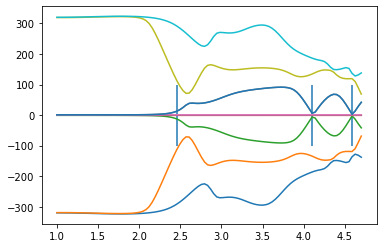

In [306]:
peaks, gs = find_resonances(energies=ens_exact_LR_plunger,
                           n=n,i=2,
                           n_peaks=5, prominence=5e-6)

first_peak = np.where(gs>10e-6)[0][0]
peaks = np.hstack([first_peak, peaks])

fig, ax = plt.subplots()
for level in ens_exact_LR_plunger.T:
    ax.plot(1e3*volts, 1e6*level)

ax.vlines(x=1e3*volts[peaks], ymin=-100, ymax=100)
ax.plot(1e3*volts, 1e6*gs)

In [307]:
averages, widths, centers = average_single_level(ens=ens_exact_LR_plunger, mus=volts)

In [308]:
mean_height = np.round(1e6*np.mean(averages), 2)
mean_width = np.round(1e3*np.mean(widths), 2)

In [309]:
widths

array([0.00164444, 0.00048586])

(0.0, 100.0)

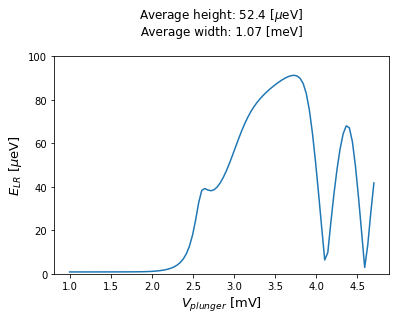

In [312]:
fig, ax = plt.subplots()

title = f'Average height: {mean_height} [$\mu$eV] \n Average width: {mean_width} [meV] \n '
ax.set_title(title)
ax.plot(1e3*volts, 1e6*gs)

ax.set_ylabel(r'$E_{LR}$ [$\mu$eV]', fontsize=13)
ax.set_xlabel(r'$V_{plunger}$ [mV]', fontsize=13)
ax.set_ylim(0, 100)

### hybrid KPM

In [839]:
# prepare basis vectors
params = sl.junction_parameters(m_nw=0, m_qd=0)

n_dot = 4
n_extra = 50

A_basis, B_basis = kpm.majorana_dot_basis(system=trijunction,
                                      f_params_potential=f_params_potential,
                                      potential=potentials_plunger[0.003],
                                      params=params,
                                      n_dot=n_dot,
                                      n_extra=n_extra,sides=2,l_cut=L*a)

In [840]:
density = kwant.operator.Density(trijunction, np.eye(4))

Text(0.5, 0.98, 'Basis vectors')

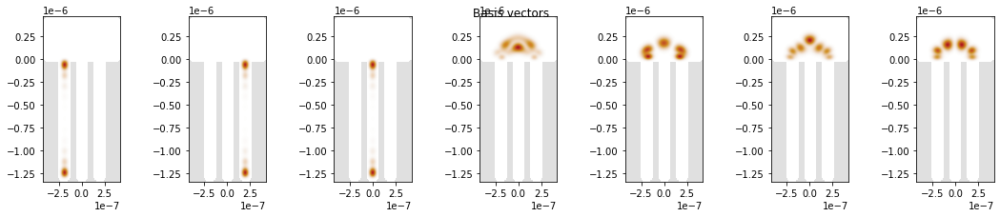

In [841]:
fig, ax = plt.subplots(ncols=3+n_dot, figsize=(15, 3))
i = 0
fig.tight_layout()
for axes in ax.flatten():
    kwant.plotter.density(trijunction, density(A_basis.T[i]), ax=axes);
    i += 1
fig.suptitle('Basis vectors')

In [793]:
# prepare unperturbed Hamiltonian
params = sl.junction_parameters(m_nw=np.array([mu, mu, mu]), m_qd=0)
f_potential = f_params_potential(potential=get_potential(potentials_plunger[0.003]),
                                 params=params)
hamiltonian = trijunction.hamiltonian_submatrix(params=f_potential,
                                           sparse=True)
H0, _ = kpm.lowdin_partition(system=trijunction,
                                  hamiltonian=hamiltonian,
                                  sides=2,
                                  l_cut=L*a) 

In [794]:
# prepare perturbations
voltage_perturbation = []
hopping_perturbation = []

for _, single_potential in potentials_plunger.items():
    barrier, hopping = kpm.prepare_perturbation(system=trijunction,
                                                unperturbed_hamiltonian=H0,
                                                f_params_potential=f_params_potential,
                                                potential=single_potential,
                                                params=params,
                                                sides=2,
                                                l_cut=L*a)
    voltage_perturbation.append(barrier)
    hopping_perturbation.append(hopping)

voltage_perturbation = np.array(voltage_perturbation)
hopping_perturbation = np.array(hopping_perturbation)

In [842]:
kpm_solver = kpm.calculate_effective_models(H0=H0,
                                            Hgate=voltage_perturbation,
                                            Hcoup=hopping_perturbation,
                                            A_basis=A_basis,
                                            B_basis=B_basis)

def kpm_wrapper(args):
    return kpm_solver(*args)

In [843]:
import scipy.linalg as la

def get_mats(p, gate, models, l, m=0):
    mats = []
    energies = []

    for i in range(l):

        try:
            mats.append(models[i](gate=gate))
        except:
            mats.append(models[i](p=p, gate=gate))
        energies.append(la.eigvalsh(mats[i]))

    return mats, energies

In [844]:
args = list(it.product(range(len(volts)), [2]))
args_db = db.from_sequence(args, npartitions=20)

In [845]:
%%time
kpm_wrapper(args[0])

CPU times: user 1min 8s, sys: 50.4 s, total: 1min 58s
Wall time: 1min 58s


<function _lambdifygenerated(gate, p)>

In [846]:
%%time
models = args_db.map(kpm_wrapper).compute()

CPU times: user 6.35 s, sys: 6.81 s, total: 13.2 s
Wall time: 59min 57s


In [999]:
mats, ens_1st_order = get_mats(p=2.4, gate=-3.6, models=models, l=len(volts), m=67)
ens_1st_order = np.array(ens_1st_order)

(-0.0003, 0.0003)

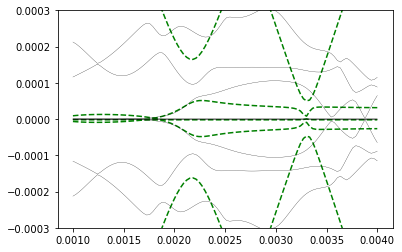

In [1000]:
for level in ens_1st_order.T:
    plt.plot(volts, level, 'g--')

for level in ens_exact_LR_plunger.T:
    plt.plot(volts, level, 'black', lw=0.25)

plt.ylim(-3e-4, 3e-4)

## Barrier gate dependence

In [1006]:
voltage_setup = get_voltage_setup_LR()
voltage_setup['plunger_gate'] = 0.003

key = 'left_tunel'
volts = np.linspace(0.00, 0.04, 100)
potentials_plunger = make_potentials(voltages=voltage_setup,
                                     parameters=volts,
                                     key=key)

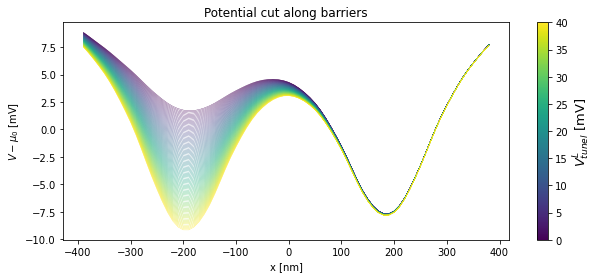

In [1009]:
plot_potential_at_barriers(volts=volts,
                           potentials=potentials_plunger,
                           mu=-mu,color_label=r'$V_{tunel}^L$ [mV]')

In [1010]:
n = 10

solver = solver_electrostatics(tj_system=[trijunction, f_params_potential],
                               voltage_setup=voltage_setup,
                               pair=0,
                               key=key,
                               n=n,
                               eigenvecs=False)

args_db = db.from_sequence(volts, npartitions=20)

In [1011]:
solver(0.001)

(array([-3.21340917e-04, -1.75925667e-04, -9.03492187e-07, -8.51477142e-07,
        -3.60964344e-07,  3.60964344e-07,  8.51477142e-07,  9.03492187e-07,
         1.75925667e-04,  3.21340917e-04]),
 [])

In [220]:
%%time
result = args_db.map(solver).compute()

CPU times: user 2.91 s, sys: 223 ms, total: 3.13 s
Wall time: 24.3 s


In [221]:
ens_exact_LR_left_tunel, _ = separate_energies_wfs(result)

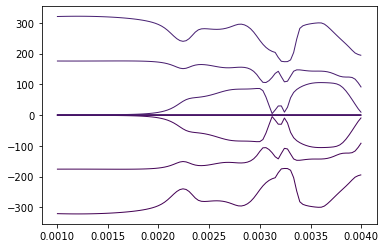

In [1001]:
fig, ax = plt.subplots()
levels = ens_exact_LR_left_tunel.T
volts_per_level = [volts for i in range(len(levels))]
multiline(xs=volts_per_level,
          ys=1e6*levels,
          c=volts,
          cmap='viridis',
          lw=1,
          ax=ax)
#ax.plot(volts_per_level, levels);

### hybrid KPM

In [1012]:
vts = list(potentials_plunger.keys())

In [1124]:
# prepare basis vectors
params = sl.junction_parameters(m_nw=0, m_qd=0)

n_dot = 4
n_extra = 20

A_basis, B_basis = kpm.majorana_dot_basis(system=trijunction,
                                      f_params_potential=f_params_potential,
                                      potential=potentials_plunger[vts[50]],
                                      params=params,
                                      n_dot=n_dot,
                                      n_extra=n_extra,sides=1,l_cut=L*a)

In [1125]:
density = kwant.operator.Density(trijunction, np.eye(4))

Text(0.5, 0.98, 'Basis vectors')

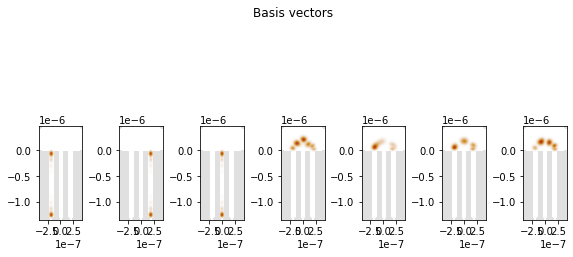

In [1126]:
fig, ax = plt.subplots(ncols=3+n_dot, figsize=(8, 5))
i = 0
fig.tight_layout()
for axes in ax.flatten():
    kwant.plotter.density(trijunction, density(A_basis.T[i]), ax=axes);
    i += 1
fig.suptitle('Basis vectors')

In [1127]:
# prepare unperturbed Hamiltonian
params = sl.junction_parameters(m_nw=np.array([mu, mu, mu]), m_qd=0)
f_potential = f_params_potential(potential=get_potential(potentials_plunger[vts[50]]),
                                 params=params)
hamiltonian = trijunction.hamiltonian_submatrix(params=f_potential,
                                           sparse=True)
H0, _ = kpm.lowdin_partition(system=trijunction,
                                  hamiltonian=hamiltonian,
                                  sides=1,
                                  l_cut=L*a) 

In [1128]:
# prepare perturbations
voltage_perturbation = []
hopping_perturbation = []

for _, single_potential in potentials_plunger.items():
    barrier, hopping = kpm.prepare_perturbation(system=trijunction,
                                                     unperturbed_hamiltonian=H0,
                                                     f_params_potential=f_params_potential,
                                                     potential=single_potential,
                                                     params=params,sides=1,l_cut=L*a)
    voltage_perturbation.append(barrier)
    hopping_perturbation.append(hopping)

voltage_perturbation = np.array(voltage_perturbation)
hopping_perturbation = np.array(hopping_perturbation)

In [1129]:
kpm_solver = kpm.calculate_effective_models(H0=H0,
                                            Hgate=voltage_perturbation,
                                            Hcoup=hopping_perturbation,
                                            A_basis=A_basis,
                                            B_basis=B_basis)

def kpm_wrapper(args):
    return kpm_solver(*args)

In [1130]:
import scipy.linalg as la

def get_mats(p, gate, models, l, m=0):
    mats = []
    energies = []

    for i in range(l):
        try:
            mats.append(models[i](gate=gate))
        except:
            mats.append(models[i](p=p, gate=gate))
        energies.append(la.eigvalsh(mats[i]))

    return mats, energies

In [1189]:
args = list(it.product(range(len(volts)), [2]))
args_db = db.from_sequence(args, npartitions=20)

In [1132]:
cluster.close()

In [1190]:
%%time
kpm_wrapper(args[0])

CPU times: user 1min 7s, sys: 49.7 s, total: 1min 57s
Wall time: 1min 57s


<function _lambdifygenerated(gate, p)>

In [1191]:
%%time
models = args_db.map(kpm_wrapper).compute()

Process SpawnProcess-52:
Traceback (most recent call last):
  File "/opt/conda/lib/python3.9/multiprocessing/process.py", line 315, in _bootstrap
    self.run()
  File "/opt/conda/lib/python3.9/multiprocessing/process.py", line 108, in run
    self._target(*self._args, **self._kwargs)
  File "/opt/conda/lib/python3.9/concurrent/futures/process.py", line 237, in _process_worker
    call_item = call_queue.get(block=True)
  File "/opt/conda/lib/python3.9/multiprocessing/queues.py", line 103, in get
    res = self._recv_bytes()
  File "/opt/conda/lib/python3.9/multiprocessing/connection.py", line 221, in recv_bytes
    buf = self._recv_bytes(maxlength)
  File "/opt/conda/lib/python3.9/multiprocessing/connection.py", line 419, in _recv_bytes
    buf = self._recv(4)
  File "/opt/conda/lib/python3.9/multiprocessing/connection.py", line 384, in _recv
    chunk = read(handle, remaining)
KeyboardInterrupt


KeyboardInterrupt: 

In [1187]:
mats, ens_1st_order = get_mats(p=-6, gate=4.6, models=models, l=len(volts), m=70)
ens_1st_order = np.array(ens_1st_order)

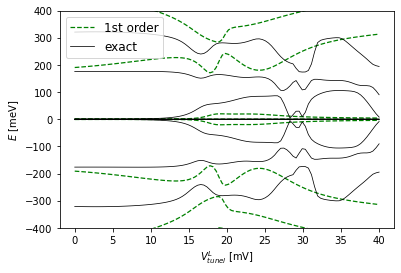

In [1188]:
for level in ens_1st_order.T:
    plt.plot(1e3*volts, 1e6*level, 'g--', lw=1.25, label='1st order')

for level in ens_exact_LR_left_tunel.T:
    plt.plot(1e3*volts, 1e6*level, 'black', lw=0.75, label='exact')

plt.ylim(-400, 400)
plt.xlabel(r'$V_{tunel}^L$ [mV]')
plt.ylabel(r'$E$ [meV]')

handles, labels = plt.gca().get_legend_handles_labels()
by_label = OrderedDict(zip(labels, handles))
plt.legend(by_label.values(), by_label.keys(), loc='upper left', fontsize=12)

###### ens_1st_order[0]

# Left - Central MBS

## Adaptive map

In [22]:
import adaptive
from operator import itemgetter
adaptive.notebook_extension()

In [23]:
params = sl.junction_parameters(m_nw=[mu, mu, mu], m_qd=0)
params.update(sl.phase(1))

### Plunger vs tunel gates

In [543]:
voltage_setup_LC = get_voltage_setup_LC()
voltage_setup_LC['central_tunel'] = 0.027
voltage_setup_LC['right_screen_triangle'] = -0.13

In [544]:
def f(xy):

    v_plunger, v_barrier = xy

    ham_mat, points = get_hamiltonian(voltage_setup=voltage_setup_LC,
                              key_1='plunger_gate',
                              val_1=v_plunger, 
                              key_2='left_tunel',
                              val_2=v_barrier,
                              params=params,
                              points=barriers)

    evals = np.sort(sla.eigsh(ham_mat.tocsc(), k=8, sigma=0, return_eigenvectors=False))

    return {'eigenvalues': np.abs(evals[-2]), 'potential': points}

In [545]:
%%time
f((0,0))

CPU times: user 10.5 s, sys: 135 ms, total: 10.7 s
Wall time: 10.6 s


{'eigenvalues': 8.983625277977923e-07,
 'potential': array([-0.01458355, -0.00939818, -0.00295027])}

In [557]:
plunger_min = 0
plunger_max = 10e-3

tunel_min = 0
tunel_max = 55e-3

In [143]:
cluster.scale(n=40)

In [560]:
data_LC = []
_learner = adaptive.Learner2D(f, bounds=[(plunger_min, plunger_max), (tunel_min, tunel_max)])
learner = adaptive.DataSaver(_learner, arg_picker=itemgetter('eigenvalues'))
runner = adaptive.Runner(learner, goal=lambda l: l.learner.loss() < 0.01, executor=client)

In [561]:
runner.live_info()

In [562]:
_, _, z = learner.interpolated_on_grid()
data_LC.append(z)

In [563]:
data_LC[0].shape

(185, 185)

Text(0.5, 1.0, 'Left tunnel gate and plunger gate')

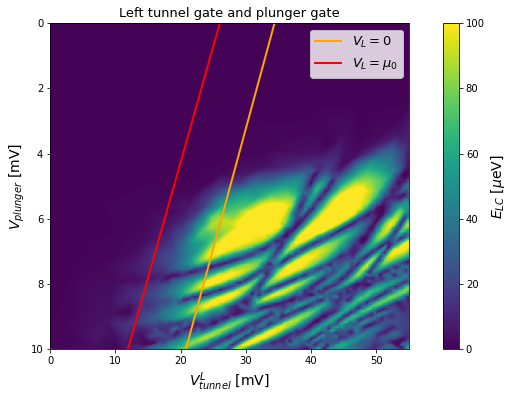

In [567]:
fig, ax = plt.subplots(figsize=(12, 6))

p = ax.imshow(1e6*data_LC[0],
              extent=(1e3*tunel_min, 1e3*tunel_max, 1e3*plunger_max, 1e3*plunger_min),
              aspect=5,vmin=0,vmax=100)
ax.set_ylabel(r'$V_{plunger}$ [mV]', fontsize=14)
ax.set_xlabel(r'$V_{tunnel}^L$ [mV]', fontsize=14)
cb = plt.colorbar(p, ax=ax)
cb.set_label(r'$E_{LC}$ [$\mu$eV]', fontsize=14)

x = np.array([0, 55])

crossings_L_0 = tunnel_crossing(learner, mu=0, index=1, tol=1e-5)
crossings_L_mu = tunnel_crossing(learner, mu=-mu, index=1, tol=4e-5)

f_L_0 = f_line(1e3*crossings_L_0[0], 1e3*crossings_L_0[1])
f_L_mu = f_line(1e3*crossings_L_mu[0], 1e3*crossings_L_mu[-1])

ax.plot(x, f_L_0(x), label=r'$V_L = 0$', color='orange', lw=2)
ax.plot(x, f_L_mu(x), label=r'$V_L = \mu_0$', color='red', lw=2)

ax.set_ylim(10, 0)
ax.legend(fontsize=13)
ax.set_title(r'Left tunnel gate and plunger gate', fontsize=13)

### Left vs Central tunnel gates

In [62]:
voltage_setup_LC = get_voltage_setup_LC()
voltage_setup_LC['plunger_gate'] = -0.002
voltage_setup_LC['plunger_gate'] = -0.002

In [63]:
def f(xy):

    v_plunger, v_barrier = xy

    ham_mat, points = get_hamiltonian(voltage_setup=voltage_setup_LC,
                              key_1='central_tunel',
                              val_1=v_plunger, 
                              key_2='left_tunel',
                              val_2=v_barrier,
                              params=params,
                              points=barriers)

    evals = np.sort(sla.eigsh(ham_mat.tocsc(), k=8, sigma=0, return_eigenvectors=False))

    return {'eigenvalues': np.abs(evals[-2]), 'potential': points}

In [64]:
%%time
f((0,0))

CPU times: user 1.13 s, sys: 56.6 ms, total: 1.19 s
Wall time: 1.18 s


{'eigenvalues': 8.434880308142036e-07,
 'potential': array([-0.00908198, -0.00845997, -0.00724832])}

In [71]:
tunel_min = 0
tunel_max = 55e-3

In [338]:
cluster.scale(n=40)

In [72]:
data_LC_tunnels = []
_learner = adaptive.Learner2D(f, bounds=[(tunel_min, tunel_max), (tunel_min, tunel_max)])
learner = adaptive.DataSaver(_learner, arg_picker=itemgetter('eigenvalues'))
runner = adaptive.Runner(learner, goal=lambda l: l.learner.loss() < 0.003, executor=client)

In [73]:
runner.live_info()

In [74]:
_, _, z = learner.interpolated_on_grid()
data_LC_tunnels.append(z)

In [75]:
data_LC_tunnels[0].shape

(406, 406)

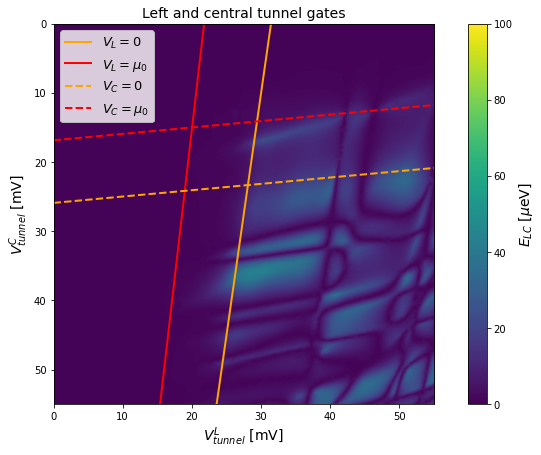

In [78]:
fig, ax = plt.subplots(figsize=(12, 7))

p = ax.imshow(1e6*data_LC_tunnels[0],
              extent=(1e3*tunel_min, 1e3*tunel_max, 1e3*tunel_max, 1e3*tunel_min),vmin=0,vmax=100)
ax.set_ylabel(r'$V_{tunnel}^{C}$ [mV]', fontsize=14)
ax.set_xlabel(r'$V_{tunnel}^{L}$ [mV]', fontsize=14)
cb = plt.colorbar(p, ax=ax)
cb.set_label(r'$E_{LC}$ [$\mu$eV]', fontsize=14)
ax.set_title(r'Left and central tunnel gates', fontsize=14)

x = np.array([0, 55])

crossings_L_0 = tunnel_crossing(learner, mu=0, index=1)
crossings_R_0 = tunnel_crossing(learner, mu=0, index=2)

crossings_L_mu = tunnel_crossing(learner, mu=-mu, index=1)
crossings_R_mu = tunnel_crossing(learner, mu=-mu, index=2)

f_L_0 = f_line(1e3*crossings_L_0[0], 1e3*crossings_L_0[1])
f_L_mu = f_line(1e3*crossings_L_mu[0], 1e3*crossings_L_mu[-1])
ax.plot(x, f_L_0(x), label=r'$V_L = 0$', color='orange', lw=2)
ax.plot(x, f_L_mu(x), label=r'$V_L = \mu_0$', color='red', lw=2)

f_R_0 = f_line(1e3*crossings_R_0[0], 1e3*crossings_R_0[-1])
f_R_mu = f_line(1e3*crossings_R_mu[0], 1e3*crossings_R_mu[1])
ax.plot(x, f_R_0(x), color='orange', lw=2, label=r'$V_C = 0$', linestyle='--')
ax.plot(x, f_R_mu(x), color='red', lw=2, label=r'$V_C = \mu_0$', linestyle='--')

ax.set_xlim(0, 55)
ax.set_ylim(55, 0)
#ax.scatter(*crossings.T*1e3, color='orange')
ax.legend(fontsize=13)

### Triangular screen tunnel gates

In [24]:
voltage_setup_LC = get_voltage_setup_LC()

In [28]:
def f(xy):

    v_plunger, v_barrier = xy

    ham_mat, points = get_hamiltonian(voltage_setup=voltage_setup_LC,
                              key_1='plunger_gate',
                              val_1=v_plunger, 
                              key_2='left_screen_center',
                              val_2=v_barrier,
                              params=params,
                              points=barriers)

    evals = np.sort(sla.eigsh(ham_mat.tocsc(), k=8, sigma=0, return_eigenvectors=False))

    return {'eigenvalues': np.abs(evals[-2]), 'potential': points}

In [29]:
%%time
f((0,0))

CPU times: user 1.6 s, sys: 126 ms, total: 1.73 s
Wall time: 1.72 s


{'eigenvalues': 4.9555915939148524e-05,
 'potential': array([-0.00890322,  0.00526376,  0.00727277])}

In [56]:
plunger_min = -15e-3
plunger_max = 0

screen_min = -70e-3
screen_max = 40e-3

In [31]:
cluster.scale(n=40)

In [57]:
data_LC_screen = []
_learner = adaptive.Learner2D(f, bounds=[(plunger_min, plunger_max), (screen_min, screen_max)])
learner = adaptive.DataSaver(_learner, arg_picker=itemgetter('eigenvalues'))
runner = adaptive.Runner(learner, goal=lambda l: l.learner.loss() < 0.01, executor=client)

In [58]:
runner.live_info()

In [59]:
_, _, z = learner.interpolated_on_grid()
data_LC_screen.append(z)

In [60]:
data_LC_screen[0].shape

(245, 245)

Text(0.5, 1.0, 'Plunger and triangular screen gates')

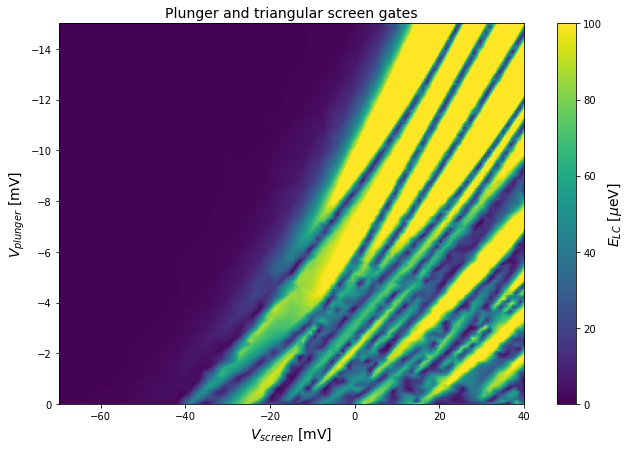

In [61]:
fig, ax = plt.subplots(figsize=(12, 7))

p = ax.imshow(1e6*data_LC_screen[0],
              extent=(1e3*screen_min, 1e3*screen_max, 1e3*plunger_max, 1e3*plunger_min),vmin=0,vmax=100,
              aspect=6)
ax.set_ylabel(r'$V_{plunger}$ [mV]', fontsize=14)
ax.set_xlabel(r'$V_{screen}$ [mV]', fontsize=14)
cb = plt.colorbar(p, ax=ax)
cb.set_label(r'$E_{LC}$ [$\mu$eV]', fontsize=14)
ax.set_title(r'Plunger and triangular screen gates', fontsize=14)

### Plunger vs barrier screen gate

In [153]:
params = sl.junction_parameters(m_nw=[mu, mu, mu], m_qd=0)
params.update(sl.phase(1))

In [154]:
voltage_setup_LC = get_voltage_setup_LC()
voltage_setup_LC

OrderedDict([('right_screen_center', -0.015),
             ('right_screen_side', -0.015),
             ('right_screen', -0.015),
             ('left_screen_center', -0.065),
             ('left_screen_side', -0.015),
             ('left_screen', -0.015),
             ('right_screen_triangle', -0.015),
             ('left_screen_triangle', -0.015),
             ('top_screen', -0.015),
             ('central_tunel', 0.037),
             ('left_tunel', 0.03),
             ('right_tunel', -0.02),
             ('plunger_gate', 0.01)])

In [122]:
def f(xy):

    v_plunger, v_barrier = xy

    ham_mat, points = get_hamiltonian(voltage_setup=voltage_setup_LC,
                              key_1='plunger_gate',
                              val_1=v_plunger, 
                              key_2='left_screen_center',
                              val_2=v_barrier,
                              params=params,
                              points=barriers)

    evals = np.sort(sla.eigsh(ham_mat.tocsc(), k=8, sigma=0, return_eigenvectors=False))

    return {'eigenvalues': np.abs(evals[-3]), 'potential': points}

In [123]:
%%time
f((0,0))

CPU times: user 1.58 s, sys: 94.6 ms, total: 1.67 s
Wall time: 1.66 s


{'eigenvalues': 8.289667237541367e-07,
 'potential': array([-0.00929126, -0.00232422,  0.00410459])}

In [124]:
plunger_min = -5e-3
plunger_max = 5e3

screen_min = -20e-3
screen_max = 20e-3

In [53]:
cluster.scale(n=40)

In [125]:
data_LC_screen = []
_learner = adaptive.Learner2D(f, bounds=[(plunger_min, plunger_max), (screen_min, screen_max)])
learner = adaptive.DataSaver(_learner, arg_picker=itemgetter('eigenvalues'))
runner = adaptive.Runner(learner, goal=lambda l: l.learner.loss() < 0.005, executor=client)

In [126]:
runner.live_info()

In [127]:
_, _, z = learner.interpolated_on_grid()
data_LC_screen.append(z)

In [128]:
data_LC_screen[0].shape

(1052, 1052)

Text(0.5, 1.0, 'Plunger and middle screen gate')

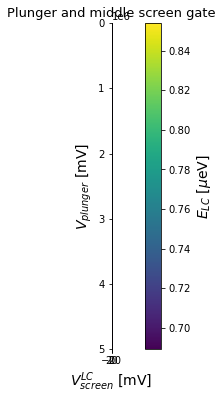

In [130]:
fig, ax = plt.subplots(figsize=(12, 6))

p = ax.imshow(1e6*data_LC_screen[0],
              extent=(1e3*screen_min, 1e3*screen_max, 1e3*plunger_max, 1e3*plunger_min),
              aspect=5)
ax.set_ylabel(r'$V_{plunger}$ [mV]', fontsize=14)
ax.set_xlabel(r'$V_{screen}^{LC}$ [mV]', fontsize=14)
cb = plt.colorbar(p, ax=ax)
cb.set_label(r'$E_{LC}$ [$\mu$eV]', fontsize=14)


ax.set_title(r'Plunger and middle screen gate', fontsize=13)

# Plunger gate dependence

In [684]:
voltage_setup = get_voltage_setup_LC()
voltage_setup['right_screen_triangle'] = -0.3

In [685]:
key = 'plunger_gate'
volts = np.linspace(0.002, 0.008, 100)
potentials_plunger = make_potentials(voltages=voltage_setup,
                                     parameters=volts,
                                     key=key)

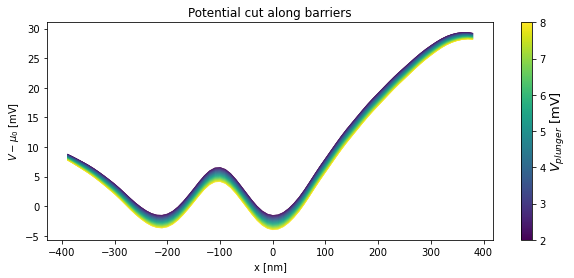

In [686]:
plot_potential_at_barriers(volts=volts,
                           potentials=potentials_plunger,
                           mu=-mu, color_label=r'$V_{plunger}$ [mV]')

In [533]:
n = 10

solver = solver_electrostatics(tj_system=[trijunction, f_params_potential],
                               voltage_setup=voltage_setup,
                               pair=0,
                               key=key,
                               n=n,
                               eigenvecs=False)

args_db = db.from_sequence(volts, npartitions=20)

In [534]:
cluster.scale(n=20)

In [535]:
%%time
result = args_db.map(solver).compute()

CPU times: user 2.15 s, sys: 39.4 ms, total: 2.19 s
Wall time: 35.4 s


In [536]:
ens_exact_LC_plunger, _ = separate_energies_wfs(result)

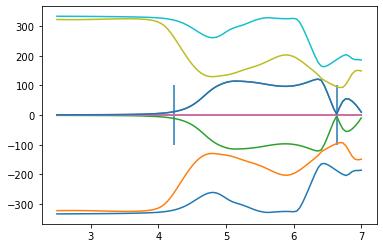

In [537]:
peaks, gs = find_resonances(energies=ens_exact_LC_plunger,
                           n=n,i=2,
                           n_peaks=5, prominence=20e-6)

first_peak = np.where(gs>10e-6)[0][0]
peaks = np.hstack([first_peak, peaks])

fig, ax = plt.subplots()
for level in ens_exact_LC_plunger.T:
    ax.plot(1e3*volts, 1e6*level)

ax.vlines(x=1e3*volts[peaks], ymin=-100, ymax=100)
ax.plot(1e3*volts, 1e6*gs)

In [538]:
averages, widths, centers = average_single_level(ens=ens_exact_LC_plunger, mus=volts)

In [539]:
mean_height = np.round(1e6*np.mean(averages), 2)
mean_width = np.round(1e3*np.mean(widths), 2)

In [540]:
averages

array([8.6951347e-05])

(0.0, 130.0)

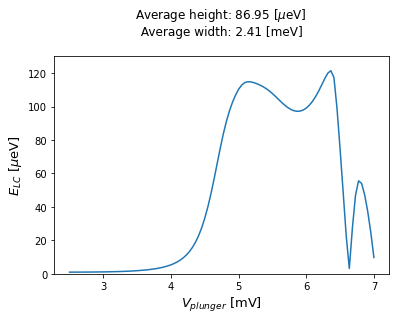

In [541]:
fig, ax = plt.subplots()

title = f'Average height: {mean_height} [$\mu$eV] \n Average width: {mean_width} [meV] \n '
ax.set_title(title)
ax.plot(1e3*volts, 1e6*gs)

ax.set_ylabel(r'$E_{LC}$ [$\mu$eV]', fontsize=13)
ax.set_xlabel(r'$V_{plunger}$ [mV]', fontsize=13)
ax.set_ylim(0, 130)

In [646]:
voltage_setup = get_voltage_setup_LC()

In [647]:
screen_voltages = np.linspace(0, -0.2, 10)
energy_cuts = []

args_db = db.from_sequence(volts, npartitions=20)

for voltage in screen_voltages:

    voltage_setup['right_screen_triangle'] = voltage
    solver = solver_electrostatics(tj_system=[trijunction, f_params_potential],
                               voltage_setup=voltage_setup,
                               pair=0,
                               key=key,
                               n=n,
                               eigenvecs=False)

    result = args_db.map(solver).compute()
    ens, _ = separate_energies_wfs(result)

    energy_cuts.append(ens)

In [665]:
lowest_levels = []

for en in energy_cuts:
    peaks, gs = find_resonances(energies=en, n=n, i=2, n_peaks=2, prominence=20e-6)
    lowest_levels.append(gs)

In [666]:
lowest_levels = np.array(lowest_levels)

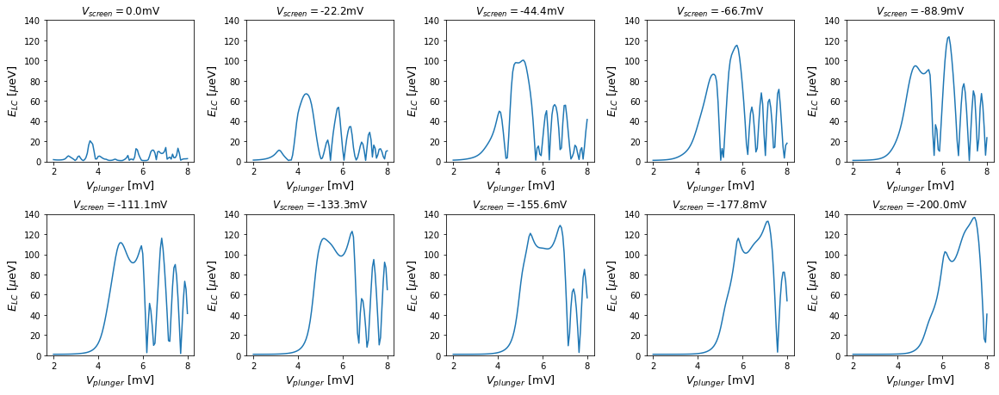

distributed.client - ERROR - Failed to reconnect to scheduler after 30.00 seconds, closing client
_GatheringFuture exception was never retrieved
future: <_GatheringFuture finished exception=CancelledError()>
asyncio.exceptions.CancelledError


In [681]:
fig, ax = plt.subplots(ncols=5, nrows=2, figsize=(16, 6))
fig.tight_layout(h_pad=4, w_pad=3)
i = 0
for axes in ax.flatten():
    axes.plot(1e3*volts, 1e6*lowest_levels[i])
    axes.set_ylabel(r'$E_{LC}$ [$\mu$eV]', fontsize=13)
    axes.set_xlabel(r'$V_{plunger}$ [mV]', fontsize=13)
    axes.set_title(r'$V_{screen}= $'+str(np.round(1e3*screen_voltages[i], 1))+'mV')
    axes.set_ylim(0, 140)
    i += 1

# Screen barrier dependence

In [44]:
voltage_setup = get_voltage_setup_LC()

In [69]:
key = 'left_screen_center'
volts = np.linspace(-0.060, 0.050, 200)
potentials_plunger = make_potentials(voltages=voltage_setup,
                                     parameters=volts,
                                     key=key)

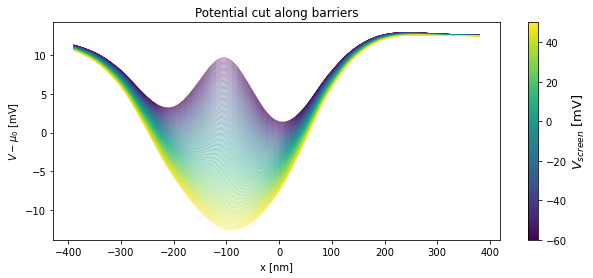

In [70]:
plot_potential_at_barriers(volts=volts,
                           potentials=potentials_plunger,
                           mu=-mu, color_label=r'$V_{screen}$ [mV]')

In [533]:
n = 10

solver = solver_electrostatics(tj_system=[trijunction, f_params_potential],
                               voltage_setup=voltage_setup,
                               pair=0,
                               key=key,
                               n=n,
                               eigenvecs=False)

args_db = db.from_sequence(volts, npartitions=20)

In [534]:
cluster.scale(n=20)

In [535]:
%%time
result = args_db.map(solver).compute()

CPU times: user 2.15 s, sys: 39.4 ms, total: 2.19 s
Wall time: 35.4 s


In [536]:
ens_exact_LC_plunger, _ = separate_energies_wfs(result)

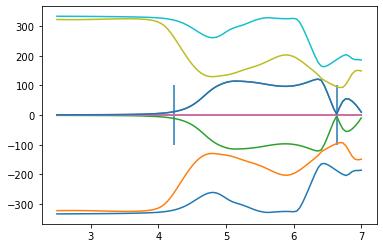

In [537]:
peaks, gs = find_resonances(energies=ens_exact_LC_plunger,
                           n=n,i=2,
                           n_peaks=5, prominence=20e-6)

first_peak = np.where(gs>10e-6)[0][0]
peaks = np.hstack([first_peak, peaks])

fig, ax = plt.subplots()
for level in ens_exact_LC_plunger.T:
    ax.plot(1e3*volts, 1e6*level)

ax.vlines(x=1e3*volts[peaks], ymin=-100, ymax=100)
ax.plot(1e3*volts, 1e6*gs)

In [538]:
averages, widths, centers = average_single_level(ens=ens_exact_LC_plunger, mus=volts)

In [539]:
mean_height = np.round(1e6*np.mean(averages), 2)
mean_width = np.round(1e3*np.mean(widths), 2)

In [540]:
averages

array([8.6951347e-05])

(0.0, 130.0)

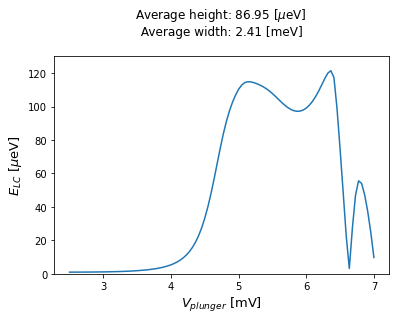

In [541]:
fig, ax = plt.subplots()

title = f'Average height: {mean_height} [$\mu$eV] \n Average width: {mean_width} [meV] \n '
ax.set_title(title)
ax.plot(1e3*volts, 1e6*gs)

ax.set_ylabel(r'$E_{LC}$ [$\mu$eV]', fontsize=13)
ax.set_xlabel(r'$V_{plunger}$ [mV]', fontsize=13)
ax.set_ylim(0, 130)

In [71]:
voltage_setup = get_voltage_setup_LC()

In [72]:
screen_voltages = np.linspace(0, -0.015, 4)
energy_cuts = []
n = 10

args_db = db.from_sequence(volts, npartitions=20)

for voltage in screen_voltages:

    voltage_setup['plunger_gate'] = voltage
    solver = solver_electrostatics(tj_system=[trijunction, f_params_potential],
                               voltage_setup=voltage_setup,
                               pair=1,
                               key=key,
                               n=n,
                               eigenvecs=False)

    result = args_db.map(solver).compute()
    ens, _ = separate_energies_wfs(result)

    energy_cuts.append(ens)

In [73]:
lowest_levels = []

for en in energy_cuts:
    peaks, gs = find_resonances(energies=en, n=n, i=2, n_peaks=2, prominence=20e-6)
    lowest_levels.append(gs)

In [74]:
lowest_levels = np.array(lowest_levels)

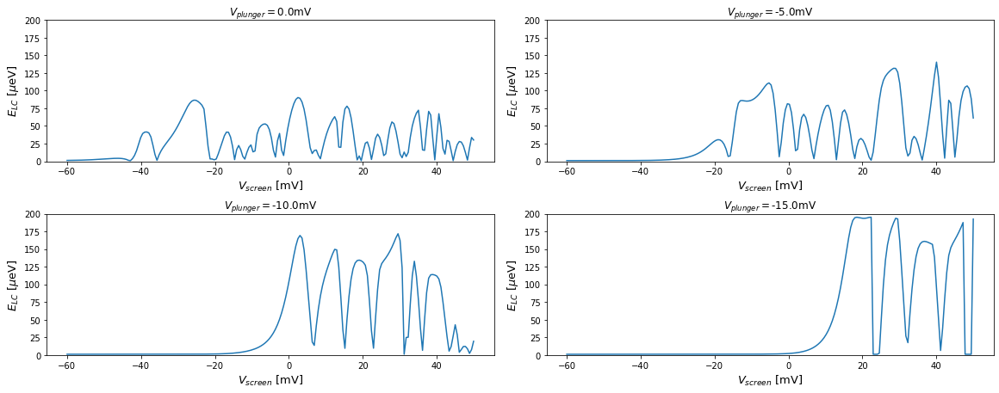

distributed.client - ERROR - Failed to reconnect to scheduler after 30.00 seconds, closing client
Exception in callback None()
handle: <Handle cancelled>
Traceback (most recent call last):
  File "/opt/conda/lib/python3.9/site-packages/tornado/iostream.py", line 1391, in _do_ssl_handshake
    self.socket.do_handshake()
  File "/opt/conda/lib/python3.9/ssl.py", line 1309, in do_handshake
    self._sslobj.do_handshake()
ssl.SSLEOFError: EOF occurred in violation of protocol (_ssl.c:1129)

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/opt/conda/lib/python3.9/asyncio/events.py", line 80, in _run
    self._context.run(self._callback, *self._args)
  File "/opt/conda/lib/python3.9/site-packages/tornado/platform/asyncio.py", line 189, in _handle_events
    handler_func(fileobj, events)
  File "/opt/conda/lib/python3.9/site-packages/tornado/iostream.py", line 696, in _handle_events
    self._handle_read()
  File "/opt/conda/lib/

In [75]:
fig, ax = plt.subplots(ncols=2, nrows=2, figsize=(16, 6))
fig.tight_layout(h_pad=4, w_pad=3)
i = 0
for axes in ax.flatten():
    axes.plot(1e3*volts, 1e6*lowest_levels[i])
    axes.set_ylabel(r'$E_{LC}$ [$\mu$eV]', fontsize=13)
    axes.set_xlabel(r'$V_{screen}$ [mV]', fontsize=13)
    axes.set_title(r'$V_{plunger}= $'+str(np.round(1e3*screen_voltages[i], 1))+'mV')
    axes.set_ylim(0, 200)
    i += 1

## hybrid KPM

In [903]:
# prepare basis vectors
params = sl.junction_parameters(m_nw=0, m_qd=0)

n_dot = 4
n_extra = 50

A_basis, B_basis = kpm.majorana_dot_basis(system=trijunction,
                                      f_params_potential=f_params_potential,
                                      potential=potentials_plunger[0.004],
                                      params=params,
                                      n_dot=n_dot,
                                      n_extra=n_extra,sides=2,l_cut=L*a)

In [685]:
#indices = [0, 1, 3, 4, 7, 8]
#A_basis = A_basis[:, indices]

In [904]:
density = kwant.operator.Density(trijunction, np.eye(4))

Text(0.5, 0.98, 'Basis vectors')

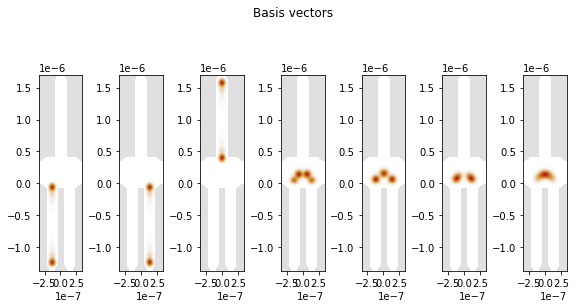

In [905]:
fig, ax = plt.subplots(ncols=3+n_dot, figsize=(8, 5))
i = 0
fig.tight_layout()
for axes in ax.flatten():
    kwant.plotter.density(trijunction, density(A_basis.T[i]), ax=axes);
    i += 1
fig.suptitle('Basis vectors')

In [886]:
# prepare unperturbed Hamiltonian
params = sl.junction_parameters(m_nw=np.array([mu, mu, mu]), m_qd=0)
f_potential = f_params_potential(potential=get_potential(potentials_plunger[0.004]),
                                 params=params)
hamiltonian = trijunction.hamiltonian_submatrix(params=f_potential,
                                           sparse=True)
H0, _ = kpm.lowdin_partition(system=trijunction,
                                  hamiltonian=hamiltonian,
                                  sides=2,
                                  l_cut=L*a) 

In [887]:
# prepare perturbations
voltage_perturbation = []
hopping_perturbation = []

for _, single_potential in potentials_plunger.items():
    barrier, hopping = kpm.prepare_perturbation(system=trijunction,
                                                unperturbed_hamiltonian=H0,
                                                f_params_potential=f_params_potential,
                                                potential=single_potential,
                                                params=params,
                                                sides=2,
                                                l_cut=L*a)
    voltage_perturbation.append(barrier)
    hopping_perturbation.append(hopping)

voltage_perturbation = np.array(voltage_perturbation)
hopping_perturbation = np.array(hopping_perturbation)

In [906]:
kpm_solver = kpm.calculate_effective_models(H0=H0,
                                            Hgate=voltage_perturbation,
                                            Hcoup=hopping_perturbation,
                                            A_basis=A_basis,
                                            B_basis=B_basis)

def kpm_wrapper(args):
    return kpm_solver(*args)

In [889]:
import scipy.linalg as la

def get_mats(p, gate, models, l, m=0):
    mats = []
    energies = []

    for i in range(l):
        if i == m:
            mats.append(models[i](gate=gate))
        else:
            mats.append(models[i](p=p, gate=gate))
        energies.append(la.eigvalsh(mats[i]))

    return mats, energies

In [983]:
args = list(it.product(range(len(volts)), [3]))
args_db = db.from_sequence(args, npartitions=20)

In [984]:
cluster.close()

In [985]:
%%time
kpm_wrapper(args[0])

KeyboardInterrupt: 

In [907]:
%%time
models = args_db.map(kpm_wrapper).compute()

CPU times: user 4.3 s, sys: 4.48 s, total: 8.78 s
Wall time: 39.5 s


In [981]:
mats, ens_1st_order = get_mats(p=-3.9, gate=2.9, models=models, l=len(volts))
ens_1st_order = np.array(ens_1st_order)

(-0.0003, 0.0003)

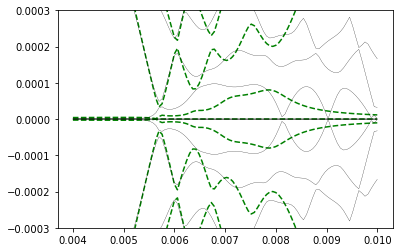

In [982]:
for level in ens_1st_order.T:
    plt.plot(volts, level, 'g--')

for level in ens_exact.T:
    plt.plot(volts, level, 'black', lw=0.25)

plt.ylim(-3e-4, 3e-4)

## Screen gate dependence

In [363]:
voltage_setup = get_voltage_setup_LC()
voltage_setup['plunger_gate'] = -0.002

key = 'left_screen_center'
volts = np.linspace(-0.032, -0.0, 100)
potentials_plunger = make_potentials(voltages=voltage_setup,
                                     parameters=volts,
                                     key=key)

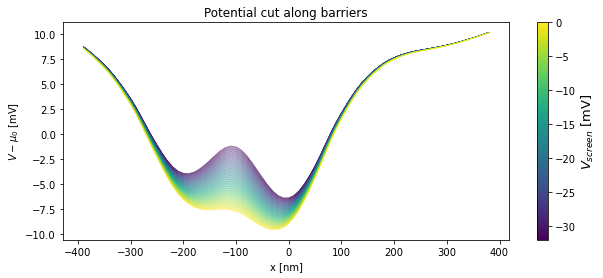

In [364]:
plot_potential_at_barriers(volts=volts,
                           potentials=potentials_plunger,
                           mu=-mu,color_label=r'$V_{screen}$ [mV]')

In [365]:
n = 10

solver = solver_electrostatics(tj_system=[trijunction, f_params_potential],
                               voltage_setup=voltage_setup,
                               pair=0,
                               key=key,
                               n=n,
                               eigenvecs=False)

args_db = db.from_sequence(volts, npartitions=20)

In [366]:
solver(0.001)

(array([-2.22486734e-04, -1.71940822e-04, -3.12979881e-05, -8.26735959e-07,
        -1.67447629e-09,  1.67447629e-09,  8.26735959e-07,  3.12979881e-05,
         1.71940822e-04,  2.22486734e-04]),
 [])

In [367]:
%%time
result = args_db.map(solver).compute()

VoronoiMesh version 0.1
DiscretePoisson version 0.3
Shape version: 0.1
SystEquations version: 0.3
Solver version 0.1
VoronoiMesh version 0.1
DiscretePoisson version 0.3
Shape version: 0.1
SystEquations version: 0.3
Solver version 0.1
VoronoiMesh version 0.1
DiscretePoisson version 0.3
Shape version: 0.1
SystEquations version: 0.3
Solver version 0.1
VoronoiMesh version 0.1
DiscretePoisson version 0.3
Shape version: 0.1
SystEquations version: 0.3
Solver version 0.1
Finding closed voronoi cells
Finding closed voronoi cells
Finding closed voronoi cells
Done selecting closed voronoi cells
Calculating points distance
Done selecting closed voronoi cells
Calculating points distance
Done selecting closed voronoi cells
Calculating points distance
Finding closed voronoi cells
Done selecting closed voronoi cells
Calculating points distance
Done
Calculating ridges hypersurfaces
Done
Calculating ridges hypersurfaces
Done
Calculating ridges hypersurfaces
Done
Calculating ridges hypersurfaces
Done
Fin

/opt/conda/lib/python3.9/site-packages/sympy/__init__.py:672: SymPyDeprecationWarning: 

importing sympy.matrices.matrices with 'from sympy import *' has been
deprecated since SymPy 1.6. Use import sympy.matrices.matrices
instead. See https://github.com/sympy/sympy/issues/18245 for more
info.

  self.Warn(
/opt/conda/lib/python3.9/site-packages/sympy/__init__.py:672: SymPyDeprecationWarning: 

importing sympy.matrices.matrices with 'from sympy import *' has been
deprecated since SymPy 1.6. Use import sympy.matrices.matrices
instead. See https://github.com/sympy/sympy/issues/18245 for more
info.

  self.Warn(
/opt/conda/lib/python3.9/site-packages/sympy/__init__.py:672: SymPyDeprecationWarning: 

importing sympy.matrices.matrices with 'from sympy import *' has been
deprecated since SymPy 1.6. Use import sympy.matrices.matrices
instead. See https://github.com/sympy/sympy/issues/18245 for more
info.

  self.Warn(
/opt/conda/lib/python3.9/site-packages/sympy/__init__.py:672: SymPyDeprecati

CPU times: user 1.86 s, sys: 251 ms, total: 2.11 s
Wall time: 2min 49s


In [352]:
ens_exact_LC_screen, _ = separate_energies_wfs(result)

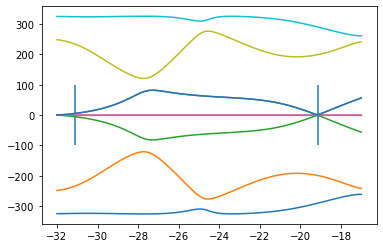

In [355]:
peaks, gs = find_resonances(energies=ens_exact_LC_screen,
                           n=n,i=2,
                           n_peaks=5, prominence=1e-6)

first_peak = np.where(gs>5e-6)[0][0]
peaks = np.hstack([first_peak, peaks])

fig, ax = plt.subplots()
for level in ens_exact_LC_screen.T:
    ax.plot(1e3*volts, 1e6*level)

ax.vlines(x=1e3*volts[peaks], ymin=-100, ymax=100)
ax.plot(1e3*volts, 1e6*gs)

In [356]:
averages, widths, centers = average_single_level(ens=ens_exact_LC_screen, mus=volts)

In [357]:
mean_height = np.round(1e6*np.mean(averages), 2)
mean_width = np.round(1e3*np.mean(widths), 2)

In [358]:
widths

array([0.0119697])

(0.0, 100.0)

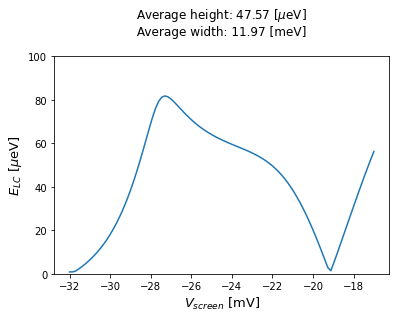

Exception in callback None()
handle: <Handle cancelled>
Traceback (most recent call last):
  File "/opt/conda/lib/python3.9/site-packages/tornado/iostream.py", line 1391, in _do_ssl_handshake
    self.socket.do_handshake()
  File "/opt/conda/lib/python3.9/ssl.py", line 1309, in do_handshake
    self._sslobj.do_handshake()
ssl.SSLEOFError: EOF occurred in violation of protocol (_ssl.c:1129)

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/opt/conda/lib/python3.9/asyncio/events.py", line 80, in _run
    self._context.run(self._callback, *self._args)
  File "/opt/conda/lib/python3.9/site-packages/tornado/platform/asyncio.py", line 189, in _handle_events
    handler_func(fileobj, events)
  File "/opt/conda/lib/python3.9/site-packages/tornado/iostream.py", line 696, in _handle_events
    self._handle_read()
  File "/opt/conda/lib/python3.9/site-packages/tornado/iostream.py", line 1478, in _handle_read
    self._do_ssl_handshak

In [362]:
fig, ax = plt.subplots()

title = f'Average height: {mean_height} [$\mu$eV] \n Average width: {mean_width} [meV] \n '
ax.set_title(title)
ax.plot(1e3*volts, 1e6*gs)

ax.set_ylabel(r'$E_{LC}$ [$\mu$eV]', fontsize=13)
ax.set_xlabel(r'$V_{screen}$ [mV]', fontsize=13)
ax.set_ylim(0, 100)

## hybrid KPM

In [1018]:
vts = list(potentials_plunger.keys())

In [1026]:
# prepare basis vectors
params = sl.junction_parameters(m_nw=0, m_qd=0)

n_dot = 4
n_extra = 20

A_basis, B_basis = kpm.majorana_dot_basis(system=trijunction,
                                      f_params_potential=f_params_potential,
                                      potential=potentials_plunger[vts[70]],
                                      params=params,
                                      n_dot=n_dot,
                                      n_extra=n_extra,sides=2,l_cut=L*a)

In [1027]:
density = kwant.operator.Density(trijunction, np.eye(4))

Text(0.5, 0.98, 'Basis vectors')

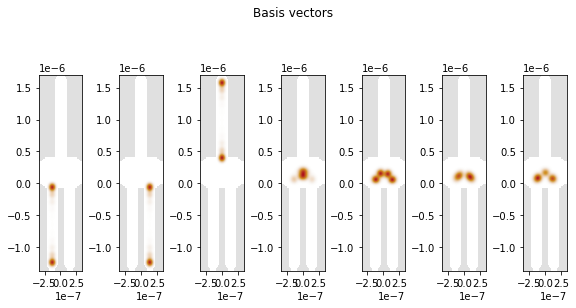

In [1028]:
fig, ax = plt.subplots(ncols=3+n_dot, figsize=(8, 5))
i = 0
fig.tight_layout()
for axes in ax.flatten():
    kwant.plotter.density(trijunction, density(A_basis.T[i]), ax=axes);
    i += 1
fig.suptitle('Basis vectors')

In [1029]:
# prepare unperturbed Hamiltonian
params = sl.junction_parameters(m_nw=np.array([mu, mu, mu]), m_qd=0)
f_potential = f_params_potential(potential=get_potential(potentials_plunger[vts[70]]),
                                 params=params)
hamiltonian = trijunction.hamiltonian_submatrix(params=f_potential,
                                           sparse=True)
H0, _ = kpm.lowdin_partition(system=trijunction,
                                  hamiltonian=hamiltonian,
                                  sides=2,
                                  l_cut=L*a) 

In [1030]:
# prepare perturbations
voltage_perturbation = []
hopping_perturbation = []

for _, single_potential in potentials_plunger.items():
    barrier, hopping = kpm.prepare_perturbation(system=trijunction,
                                                     unperturbed_hamiltonian=H0,
                                                     f_params_potential=f_params_potential,
                                                     potential=single_potential,
                                                     params=params,sides=2,l_cut=L*a)
    voltage_perturbation.append(barrier)
    hopping_perturbation.append(hopping)

voltage_perturbation = np.array(voltage_perturbation)
hopping_perturbation = np.array(hopping_perturbation)

In [1031]:
kpm_solver = kpm.calculate_effective_models(H0=H0,
                                            Hgate=voltage_perturbation,
                                            Hcoup=hopping_perturbation,
                                            A_basis=A_basis,
                                            B_basis=B_basis)

def kpm_wrapper(args):
    return kpm_solver(*args)

In [1032]:
import scipy.linalg as la

def get_mats(p, gate, models, l, m=0):
    mats = []
    energies = []

    for i in range(l):
        if i == m:
            mats.append(models[i](gate=gate))
        else:
            mats.append(models[i](p=p, gate=gate))
        energies.append(la.eigvalsh(mats[i]))

    return mats, energies

In [1034]:
args = list(it.product(range(len(volts)), [1]))
args_db = db.from_sequence(args, npartitions=20)

In [1036]:
cluster.close()

In [1037]:
%%time
kpm_wrapper(args[0])

CPU times: user 605 ms, sys: 3.96 ms, total: 609 ms
Wall time: 605 ms


<function _lambdifygenerated(gate, p)>

In [1038]:
%%time
models = args_db.map(kpm_wrapper).compute()

CPU times: user 3.43 s, sys: 3.49 s, total: 6.92 s
Wall time: 30.8 s


In [461]:
models[10:12]

[<function _lambdifygenerated(gate)>, <function _lambdifygenerated(gate, p)>]

In [1196]:
mats, ens_1st_order = get_mats(p=8.05, gate=-9, models=models, l=len(volts), m=70)
ens_1st_order = np.array(ens_1st_order)

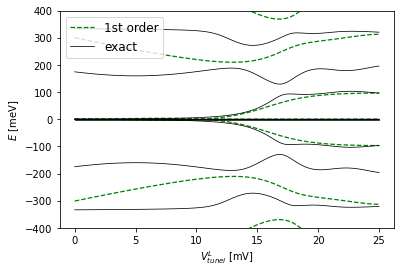

In [1207]:
for level in ens_1st_order.T:
    plt.plot(1e3*volts, 1e6*level, 'g--', lw=1.25, label='1st order')

for level in ens_exact.T:
    plt.plot(1e3*volts, 1e6*level, 'black', lw=0.75, label='exact')

plt.ylim(-400, 400)
plt.xlabel(r'$V_{tunel}^L$ [mV]')
plt.ylabel(r'$E$ [meV]')

handles, labels = plt.gca().get_legend_handles_labels()
by_label = OrderedDict(zip(labels, handles))
plt.legend(by_label.values(), by_label.keys(), loc='upper left', fontsize=12)